In [1]:
import numpy as np
import librosa
import os
import librosa
import librosa.display
import IPython.display as ipd
import pandas as pd
import math
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
f_dir_="./ICBHI_final_database/";

In [3]:
data={}
import csv
filename = "./Book1.csv"
rows = []
with open(filename) as file_obj:
    reader_obj = csv.reader(file_obj)
    for row in reader_obj:
        data[int(row[0])]=row[1]

In [4]:
 #URTI Patient
ipd.Audio(f_dir_+"101_1b1_Al_sc_Meditron.wav")

In [5]:
#Healthy Patient
ipd.Audio(f_dir_+"102_1b1_Ar_sc_Meditron.wav")

In [6]:
#COPD Patient
ipd.Audio(f_dir_+"106_2b1_Pl_mc_LittC2SE.wav")

In [7]:
#Bronchiectasis Patient
ipd.Audio(f_dir_+"111_1b2_Tc_sc_Meditron.wav")

In [8]:
#Bronchiolitis Patient
ipd.Audio(f_dir_+"149_1b1_Al_sc_Meditron.wav")

In [9]:
#Pneumonia Patient
ipd.Audio(f_dir_+"122_2b1_Al_mc_LittC2SE.wav")

(-0.4, 0.4)

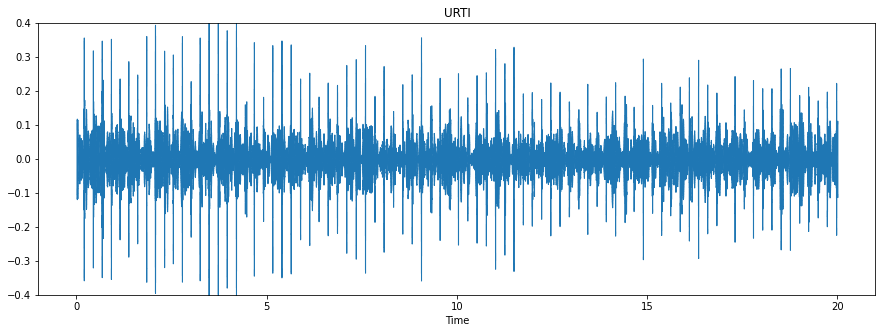

In [10]:
plt.figure(figsize=(15,17))
plt.subplot(3,1,1)
URTI , sr =librosa.load(f_dir_+"101_1b1_Al_sc_Meditron.wav")
librosa.display.waveshow(URTI)
plt.title("URTI")
plt.ylim((-0.4,0.4))


(-0.1, 0.1)

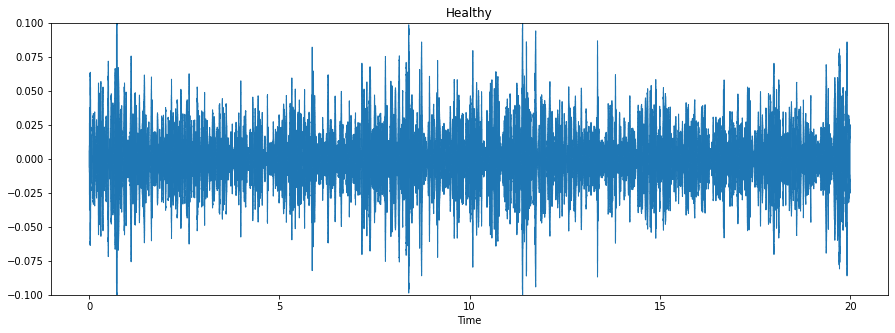

In [11]:
plt.figure(figsize=(15,17))
plt.subplot(3,1,1)
Healthy , sr =librosa.load(f_dir_+"102_1b1_Ar_sc_Meditron.wav")
librosa.display.waveshow(Healthy)
plt.title("Healthy")
plt.ylim((-0.1,0.1))

(-0.3, 0.3)

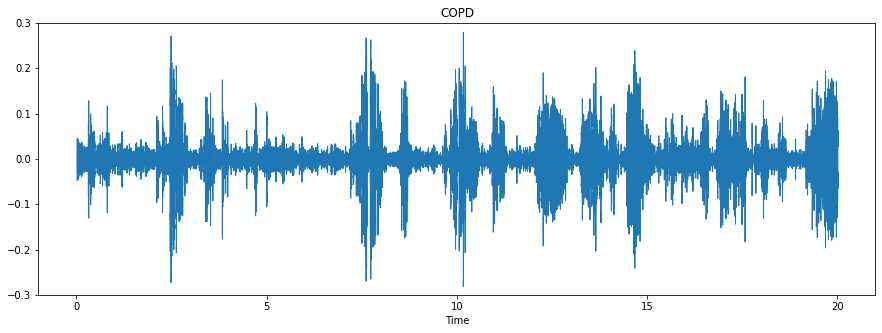

In [12]:
plt.figure(figsize=(15,17))
plt.subplot(3,1,1)
COPD , sr =librosa.load(f_dir_+"106_2b1_Pl_mc_LittC2SE.wav")
librosa.display.waveshow(COPD)
plt.title("COPD")
plt.ylim((-0.3,0.3))

(-0.04, 0.04)

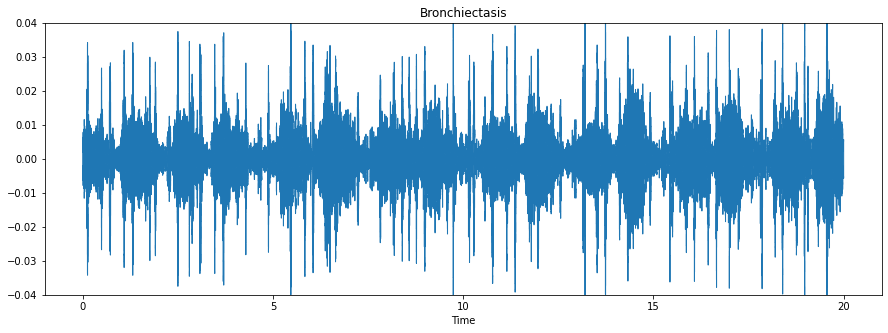

In [13]:
plt.figure(figsize=(15,17))
plt.subplot(3,1,1)
Bronchiectasis , sr =librosa.load(f_dir_+"111_1b2_Tc_sc_Meditron.wav")
librosa.display.waveshow(Bronchiectasis)
plt.title("Bronchiectasis")
plt.ylim((-0.04,0.04))

(-0.3, 0.3)

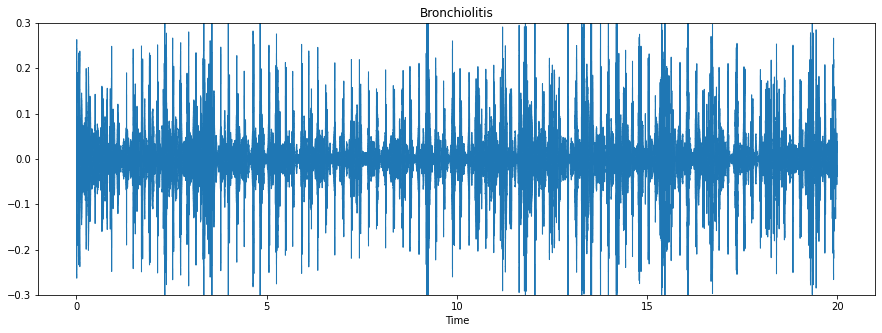

In [14]:
plt.figure(figsize=(15,17))
plt.subplot(3,1,1)
Bronchiolitis , sr =librosa.load(f_dir_+"149_1b1_Al_sc_Meditron.wav")
librosa.display.waveshow(Bronchiolitis)
plt.title("Bronchiolitis")
plt.ylim((-0.3,0.3))

(-0.3, 0.3)

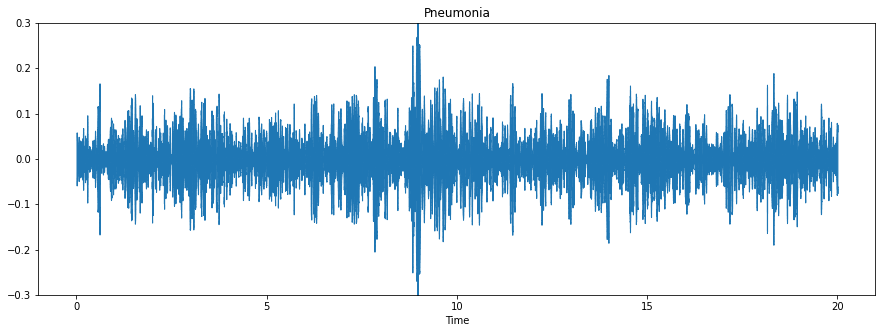

In [15]:
plt.figure(figsize=(15,17))
plt.subplot(3,1,1)
Pneumonia , sr =librosa.load(f_dir_+"122_2b1_Al_mc_LittC2SE.wav")
librosa.display.waveshow(Pneumonia)
plt.title("Pneumonia")
plt.ylim((-0.3,0.3))

In [16]:
import json
def add_noise(data,x):
    noise = np.random.randn(len(data))
    data_noise = data + x * noise
    return data_noise

def shift(data,x):
    return np.roll(data, x)

def stretch(data, rate):
    data = librosa.effects.time_stretch(data, rate)
    return data
JSON_PATH = "./data_10.json"
def InstantiateAttributes(dir_):
    X_=[]
    y_=[]
    COPD=[]
    dat = {
        "labels": [],
        "mfcc": []
    }
    mapping={
        "Healthy":0,
        "URTI":1,
        "COPD":2,
        "Bronchiectasis":3,
        "Bronchiolitis":4,
        "Pneumonia":5
    }
    copd_count=0
    for soundDir in (os.listdir(dir_)):
            a=[[0,0,0,0,0,0]]
            if soundDir[-3:]=='wav'and soundDir[:3]!='103'and soundDir[:3]!='108'and soundDir[:3]!='115':
                p = data[int(soundDir[:3])]
                if (p=='COPD'):
                    a[0][mapping[data[int(soundDir[:3])]]]=1;
                    if (soundDir[:3] in COPD) and copd_count<2:
                        data_x, sampling_rate = librosa.load(dir_+soundDir,res_type='kaiser_fast')
                    # 40 features are extracted from each audio data and used to train the model.
                        mfccs = np.mean(librosa.feature.mfcc(y=data_x, sr=sampling_rate, n_mfcc=40).T,axis=0)
                        mfccs = np.reshape(mfccs,(1,len(mfccs)))
                        COPD.append(soundDir[:3])
                        copd_count+=1
                        dat["mfcc"].append(mfccs.tolist());
                        dat["labels"].append(a)
                    if (soundDir[:3] not in COPD):
                        data_x, sampling_rate = librosa.load(dir_+soundDir,res_type='kaiser_fast')
                        mfccs = np.mean(librosa.feature.mfcc(y=data_x, sr=sampling_rate, n_mfcc=40).T,axis=0)
                        mfccs = np.reshape(mfccs,(1,len(mfccs)))                
                        COPD.append(soundDir[:3])
                        copd_count=0
                        dat["mfcc"].append(mfccs.tolist());
                        dat["labels"].append(a) 
                if (p!='COPD'):
                    data_x, sampling_rate = librosa.load(dir_+soundDir,res_type='kaiser_fast')
                    mfccs = np.mean(librosa.feature.mfcc(y=data_x, sr=sampling_rate, n_mfcc=40).T,axis=0)
                    mfccs = np.reshape(mfccs,(1,len(mfccs)))
                    a[0][mapping[data[int(soundDir[:3])]]]=1;
                    dat["mfcc"].append(mfccs.tolist());
                    dat["labels"].append(a)
    
                    data_noise = add_noise(data_x,0.005)
                    mfccs_noise = np.mean(librosa.feature.mfcc(y=data_noise, sr=sampling_rate, n_mfcc=40).T,axis=0)
                    mfccs_noise = np.reshape(mfccs_noise,(1,len(mfccs_noise)))
                    dat["mfcc"].append(mfccs_noise.tolist());
                    dat["labels"].append(a)    

                    data_shift = shift(data_x,1600)
                    mfccs_shift = np.mean(librosa.feature.mfcc(y=data_shift, sr=sampling_rate, n_mfcc=40).T,axis=0)
                    mfccs_shift = np.reshape(mfccs_shift,(1,len(mfccs_shift)))
                    dat["mfcc"].append(mfccs_shift.tolist());
                    dat["labels"].append(a)
    
                    data_stretch = stretch(data_x,1.2)
                    mfccs_stretch = np.mean(librosa.feature.mfcc(y=data_stretch, sr=sampling_rate, n_mfcc=40).T,axis=0)
                    mfccs_stretch = np.reshape(mfccs_stretch,(1,len(mfccs_stretch)))
                    dat["mfcc"].append(mfccs_stretch.tolist());
                    dat["labels"].append(a)
    
                    data_stretch_2 = stretch(data_x,0.8)
                    mfccs_stretch_2 = np.mean(librosa.feature.mfcc(y=data_stretch_2, sr=sampling_rate, n_mfcc=40).T,axis=0)
                    mfccs_stretch_2 = np.reshape(mfccs_stretch_2,(1,len(mfccs_stretch_2)))
                    dat["mfcc"].append(mfccs_stretch_2.tolist());
                    dat["labels"].append(a) 
    
    with open(JSON_PATH, "w") as fp:
        json.dump(dat, fp, indent=4)

In [17]:
from keras.utils import np_utils
from keras.layers import add, Conv2D,Input,BatchNormalization,TimeDistributed,Embedding,LSTM,GRU,Dense,MaxPooling1D,Dropout,LeakyReLU,ReLU,Flatten,concatenate,Bidirectional
from keras.layers.merge import concatenate
from keras.models import Model,load_model

In [18]:
def InstantiateModel(in_):
    '''
      Architecture of the Deep Learning Model.
      Args:
        in_: input tensor shape
      Returns: Tensor model
    '''
    model_2_1 = GRU(32,return_sequences=True,activation=None,go_backwards=True)(in_)
    model_2 = LeakyReLU()(model_2_1)
    model_2 = GRU(128,return_sequences=True, activation=None,go_backwards=True)(model_2)
    #model_2 = BatchNormalization()(model_2)
    model_2 = LeakyReLU()(model_2)
    
    model_3 = GRU(64,return_sequences=True,activation=None,go_backwards=True)(in_)
    model_3 = LeakyReLU()(model_3)
    model_3 = GRU(128,return_sequences=True, activation=None,go_backwards=True)(model_3)
    #model_3 = BatchNormalization()(model_3)
    model_3 = LeakyReLU()(model_3)
    
    model_add_1 = add([model_3,model_2])
    
    model_5 = GRU(128,return_sequences=True,activation=None,go_backwards=True)(model_add_1)
    model_5 = LeakyReLU()(model_5)
    model_5 = GRU(32,return_sequences=True, activation=None,go_backwards=True)(model_5)
    model_5 = LeakyReLU()(model_5)
    
    model_6 = GRU(64,return_sequences=True,activation=None,go_backwards=True)(model_add_1)
    model_6 = LeakyReLU()(model_6)
    model_6 = GRU(32,return_sequences=True, activation=None,go_backwards=True)(model_6)
    model_6 = LeakyReLU()(model_6)
    
    model_add_2 = add([model_5,model_6,model_2_1])
    
    
    model_7 = Dense(64, activation=None)(model_add_2)
    model_7 = LeakyReLU()(model_7)
    model_7 = Dropout(0.2)(model_7)
    model_7 = Dense(16, activation=None)(model_7)
    model_7 = LeakyReLU()(model_7)
    
    model_9 = Dense(32, activation=None)(model_add_2)
    model_9 = LeakyReLU()(model_9)
    model_9 = Dropout(0.2)(model_9)
    model_9 = Dense(16, activation=None)(model_9)
    model_9 = LeakyReLU()(model_9)
    
    model_add_3 = add([model_7,model_9])

    model_10 = Dense(16, activation=None)(model_add_3)
    #model_10 = BatchNormalization()(model_10)
    model_10 = LeakyReLU()(model_10)
    model_10 = Dropout(0.5)(model_10)
    #Model_7 = MaxPooling1D(pool_size=2)(mode)
    model_10 = Dense(6, activation="softmax")(model_10)
    
    return model_10


In [19]:
def load_data(data_path):
    """Loads training dataset from json file.
        :param data_path (str): Path to json file containing data
        :return X (ndarray): Inputs
        :return y (ndarray): Targets
    """

    with open(data_path, "r") as fp:
        f_data = json.load(fp)

    # convert lists to numpy arrays
    X = np.array(f_data["mfcc"])
    y = np.array(f_data["labels"])

    print("Data succesfully loaded!")
    return  X, y


from keras import backend as K
from keras.models import Model
from keras.layers import Input
from tensorflow.keras.optimizers import Adamax
InstantiateAttributes(f_dir_);
X,y=load_data(JSON_PATH)

Data succesfully loaded!


In [20]:
print(X.shape)

(797, 1, 40)


In [21]:
def prepare_datasets(test_size, validation_size):
    # create train, validation and test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)
    X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=validation_size)
    return X_train, X_validation, X_test, y_train, y_validation, y_test

In [22]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.model_selection import train_test_split
from keras import backend as K
keras.backend.clear_session()
batch_size=X.shape[0]
time_steps=X.shape[1]
data_dim=X.shape[2]

Input_Sample = Input(shape=(time_steps,data_dim))
Output_ = InstantiateModel(Input_Sample)
Model_Enhancer = Model(inputs=Input_Sample, outputs=Output_)

Model_Enhancer.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer=Adamax())
ES = EarlyStopping(monitor='val_loss', min_delta=0.5, patience=200, verbose=1, mode='auto', baseline=None,
                    restore_best_weights=False)
MC = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='auto', verbose=0, save_best_only=True)

x_train, x_validation, x_test, y_train, y_validation, y_test = prepare_datasets(0.25, 0.2)
Model_Enhancer.summary()
ModelHistory = Model_Enhancer.fit(x_train, y_train, batch_size=batch_size, epochs=1000,
                                  validation_data=(x_validation, y_validation),
                                  callbacks = [MC],
                                  #class_weight=class_weights,
                                  verbose=1)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 1, 40)]      0           []                               
                                                                                                  
 gru_2 (GRU)                    (None, 1, 64)        20352       ['input_1[0][0]']                
                                                                                                  
 gru (GRU)                      (None, 1, 32)        7104        ['input_1[0][0]']                
                                                                                                  
 leaky_re_lu_2 (LeakyReLU)      (None, 1, 64)        0           ['gru_2[0][0]']                  
                                                                                              

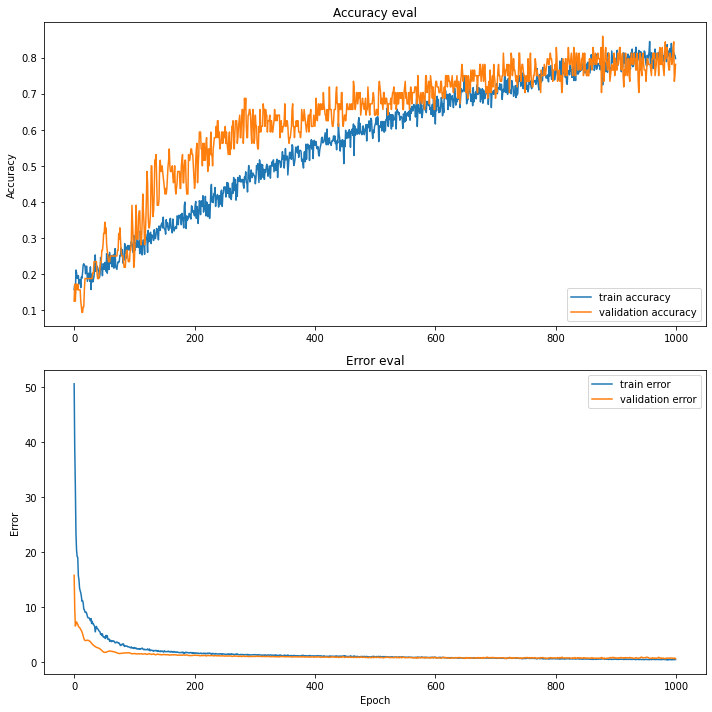

5/5 - 1s - loss: 0.6550 - accuracy: 0.8250 - 904ms/epoch - 181ms/step

Test accuracy: 0.824999988079071

Test loss: 0.6549777388572693


In [23]:
def plot_history(history):
    """Plots accuracy/loss for training/validation set as a function of the epochs
        :param history: Training history of model
        :return:''
    """

    fig, axs = plt.subplots(2)

    # create accuracy sublpot
    axs[0].plot(history.history["accuracy"], label="train accuracy")
    axs[0].plot(history.history["val_accuracy"], label="validation accuracy")
    axs[0].set_ylabel("Accuracy")
    axs[0].legend(loc="lower right")
    axs[0].set_title("Accuracy eval")

    # create error sublpot
    axs[1].plot(history.history["loss"], label="train error")
    axs[1].plot(history.history["val_loss"], label="validation error")
    axs[1].set_ylabel("Error")
    axs[1].set_xlabel("Epoch")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Error eval")
    fig.set_figwidth(10)
    fig.set_figheight(10)
    fig.tight_layout()
    plt.show()
    
plot_history(ModelHistory)
test_loss, test_acc = Model_Enhancer.evaluate(x_test, y_test, verbose=2)
print('\nTest accuracy:', test_acc)
print('\nTest loss:', test_loss)

In [24]:
def validateModel(X_val):
    '''
       Validate the performance of the Model by loading the trained model weights.
       Args:
           X_val : Array for features.

       Returns: Model prediction against the input features.
    '''
    Model_Loaded = load_model('best_model.h5')
    X_val = X_val[np.newaxis, ...]
    yhat_probs = Model_Loaded.predict(X_val, verbose=1)
    yhat_probs = yhat_probs.reshape(yhat_probs.shape[0],yhat_probs.shape[2])
    yhat_classes =np.argmax(yhat_probs,axis=1)

    return yhat_classes

X_to_predict = x_test[111]
y_to_predict = y_test[111]
print(y_to_predict)
# predict sample
y_final=0
for i in range (len(y_to_predict[0])):
    if(y_to_predict[0][i]==1):
        y_final=i;
        break
print("Target: {}, Predicted label: {}".format(y_final, validateModel(X_to_predict)))

[[1 0 0 0 0 0]]
1/1 [==============================] - 1s 917ms/step
Target: 0, Predicted label: [0]
